<a href="https://colab.research.google.com/github/TamatiKJ/wellbeing-data-science/blob/main/data_analysis_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Exploratory Data Analysis

In [22]:
# @title Download and extract the data
%%bash
#https://drive.google.com/file/d/1B4JI7wpGSNnXjq3kKoa1k4F0e_JWySfC/view?usp=sharing
rm -rf input && mkdir -p input/data
wget --no-check-certificate -q "https://docs.google.com/uc?export=download&id=1FQ-JE9kKruURe20TqSrn38tNqvaAdPIj" \
    -O input/data.zip
unzip input/*.zip -d input/data


Archive:  input/data.zip
  inflating: input/data/test.csv     
  inflating: input/data/train.csv    


In [23]:
# @title Install required packages
import sys

!{sys.executable} -m pip install -q ydata-profiling

In [24]:
# @title Imports
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_selection import mutual_info_regression
from ydata_profiling import ProfileReport


In [25]:
# @title Config
# file paths
DATA_DIR = Path("input/data")

# data
TRAIN_DATA = DATA_DIR / "train.csv"
TEST_DATA = DATA_DIR / "test.csv"

# columns in the data
INDEX_COL = "ID"

TARGET_COL = "Well-Being Index"

# random state
RANDOM_SEED = 42

# plots
%matplotlib inline
sns.set_theme(context="notebook", style="whitegrid", rc={"figure.figsize": (14, 8)})

In [26]:
# @title Loading the data
df = pd.read_csv(TRAIN_DATA, index_col=INDEX_COL)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3097 entries, 10065 to 998085
Data columns (total 80 columns):
 #   Column                                                                                   Non-Null Count  Dtype  
---  ------                                                                                   --------------  -----  
 0   galactic year                                                                            3097 non-null   int64  
 1   galaxy                                                                                   3097 non-null   object 
 2   existence expectancy index                                                               3096 non-null   float64
 3   existence expectancy at birth                                                            3096 non-null   float64
 4   Gross income per capita                                                                  3069 non-null   float64
 5   Income Index                                            

In [27]:
# @title Pandas profiling report
report = ProfileReport(df, minimal=True)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Separate features from target

In [35]:
y = df[TARGET_COL]
X = df.drop(TARGET_COL, axis=1)

numeric_dtypes = ["int64", "float64"]
categorical_df = X.select_dtypes(exclude=numeric_dtypes)
numeric_df = X.select_dtypes(include=numeric_dtypes)

## Distribution of variables

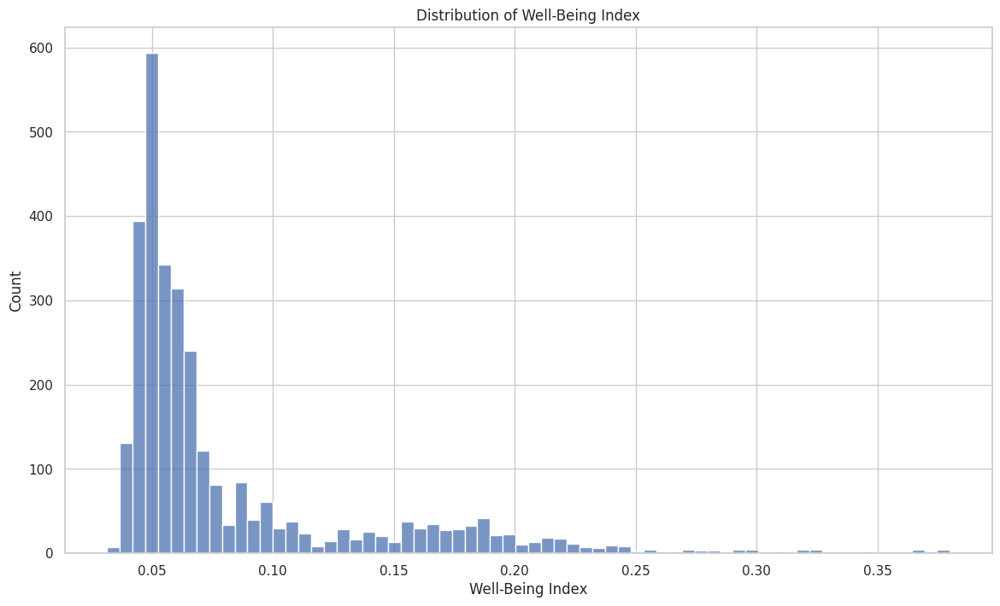

In [29]:
# @title Target variable
fig, ax = plt.subplots()

sns.histplot(x=y, ax=ax)
ax.set_title(f"Distribution of {TARGET_COL}")
plt.show()

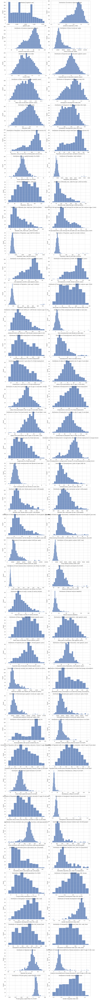

In [30]:
# @title Numeric features
cols = 2
rows = np.ceil(numeric_df.shape[1] / cols).astype(int)
fig, axes = plt.subplots(rows, 2, figsize=(14, 8 // cols * rows))
plt.tight_layout()

for i, col in enumerate(numeric_df.columns):
    ax = axes[i // cols, i % cols]
    sns.histplot(data=df, x=col, ax=ax)
    ax.set_title(f"Distribution of {col}", y=0.88)
plt.show()

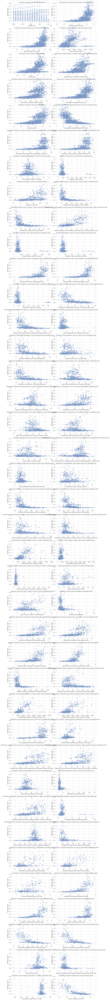

In [31]:
# @title Numeric features by target
cols = 2
rows = np.ceil(numeric_df.shape[1] / cols).astype(int)
fig, axes = plt.subplots(rows, 2, figsize=(14, 8 // cols * rows))
plt.tight_layout()

for i, col in enumerate(numeric_df.columns):
    ax = axes[i // 2, i % 2]
    sns.scatterplot(data=df, x=col, y=TARGET_COL, ax=ax)
    ax.set_title(f"Distribution of {col} by {TARGET_COL}", y=0.88)
plt.show()

## Categorical features by targe

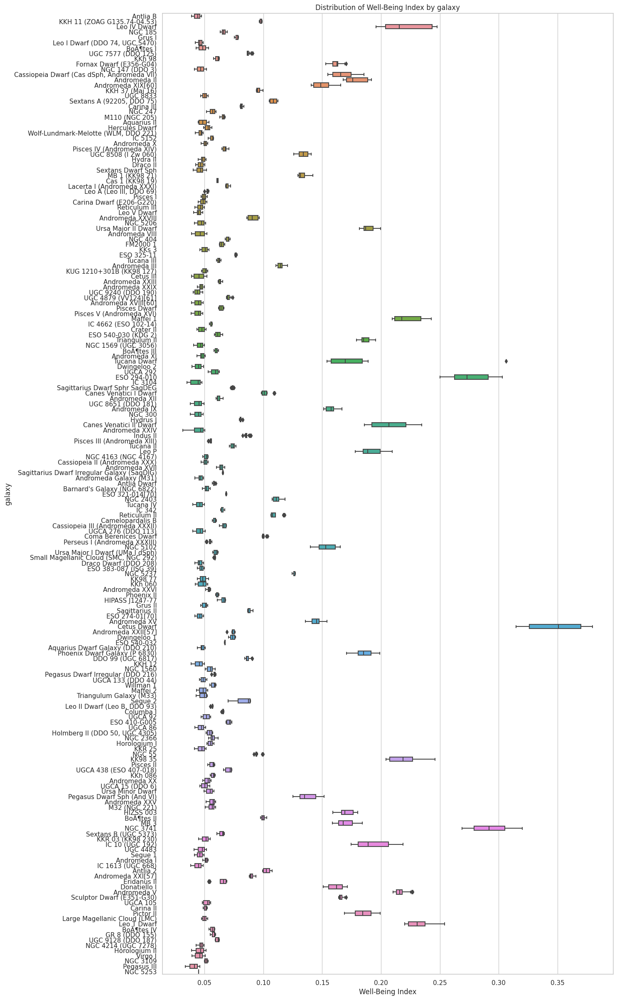

In [32]:
fig, ax = plt.subplots(figsize=(14, 30))
sns.boxplot(data=df, x=TARGET_COL, y="galaxy", ax=ax)
ax.set_title(f"Distribution of {TARGET_COL} by galaxy")
plt.show()

## Missing values

In [33]:
# @title Check the proportion of missing values per column
for threshold in (np.arange(5, 100, 5) / 100):
    num_cols = ((df.isna().sum() / len(df)) > threshold).sum()
    print(f"Number of columns with more than {threshold:.0%} missing: {num_cols}")

Number of columns with more than 5% missing: 72
Number of columns with more than 10% missing: 72
Number of columns with more than 15% missing: 68
Number of columns with more than 20% missing: 68
Number of columns with more than 25% missing: 68
Number of columns with more than 30% missing: 68
Number of columns with more than 35% missing: 68
Number of columns with more than 40% missing: 68
Number of columns with more than 45% missing: 68
Number of columns with more than 50% missing: 68
Number of columns with more than 55% missing: 68
Number of columns with more than 60% missing: 66
Number of columns with more than 65% missing: 66
Number of columns with more than 70% missing: 66
Number of columns with more than 75% missing: 65
Number of columns with more than 80% missing: 32
Number of columns with more than 85% missing: 14
Number of columns with more than 90% missing: 2
Number of columns with more than 95% missing: 0


In [36]:
# @title Deal with missing values
# select columns with missing values not exceeding threshold
threshold = 0.7
selected_cols = X.columns[(X.isna().sum() / len(X)) < threshold]

# impute
numeric_df = numeric_df[numeric_df.columns[numeric_df.columns.isin(selected_cols)]]
numeric_df = numeric_df.fillna(numeric_df.median())
X = categorical_df.join(numeric_df)
display(X.info())
any(X.isna().sum() > 0)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3097 entries, 10065 to 998085
Data columns (total 13 columns):
 #   Column                                                       Non-Null Count  Dtype  
---  ------                                                       --------------  -----  
 0   galaxy                                                       3097 non-null   object 
 1   galactic year                                                3097 non-null   int64  
 2   existence expectancy index                                   3097 non-null   float64
 3   existence expectancy at birth                                3097 non-null   float64
 4   Gross income per capita                                      3097 non-null   float64
 5   Income Index                                                 3097 non-null   float64
 6   Expected years of education (galactic years)                 3097 non-null   float64
 7   Mean years of education (galactic years)                     3097 non-nu

None

False

In [37]:
# @title Label encoding categorical features
for col in categorical_df.columns:
    X[col], _ = X[col].factorize()

X[categorical_df.columns].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3097 entries, 10065 to 998085
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   galaxy  3097 non-null   int64
dtypes: int64(1)
memory usage: 112.9 KB


In [39]:
# @title Correlation matrix
df[selected_cols.to_list() + [TARGET_COL]].corr()

<ipython-input-39-67ea7253ecf6>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df[selected_cols.to_list() + [TARGET_COL]].corr()


,galactic year,existence expectancy index,existence expectancy at birth,Gross income per capita,Income Index,Expected years of education (galactic years),Mean years of education (galactic years),Intergalactic Development Index (IDI),Education Index,"Intergalactic Development Index (IDI), Rank",Population using at least basic drinking-water services (%),Population using at least basic sanitation services (%),Well-Being Index
galactic year,1.000000,0.132886,0.129963,0.083711,0.093645,0.246112,0.179790,0.141344,0.215237,0.165259,0.086431,0.078298,0.016315
existence expectancy index,0.132886,1.000000,0.910615,0.493711,0.721775,0.723083,0.661653,0.823243,0.704162,-0.754691,0.770043,0.758142,0.584568
existence expectancy at birth,0.129963,0.910615,1.000000,0.505056,0.729360,0.723787,0.661207,0.829971,0.708900,-0.756062,0.764935,0.763795,0.587930
Gross income per capita,0.083711,0.493711,0.505056,1.000000,0.734411,0.477747,0.442323,0.603421,0.482661,-0.625553,0.472370,0.531217,0.507892
Income Index,0.093645,0.721775,0.729360,0.734411,1.000000,0.715325,0.641012,0.831699,0.704032,-0.800124,0.703354,0.741654,0.606666
Expected years of education (galactic years),0.246112,0.723083,0.723787,0.477747,0.715325,1.000000,0.753190,0.831770,0.853048,-0.727899,0.684648,0.712029,0.611651
Mean years of education (galactic years),0.179790,0.661653,0.661207,0.442323,0.641012,0.753190,1.000000,0.793341,0.866746,-0.719825,0.664508,0.708912,0.611781
Intergalactic Development Index (IDI),0.141344,0.823243,0.829971,0.603421,0.831699,0.831770,0.793341,1.000000,0.843432,-0.828702,0.781372,0.808189,0.661725
Education Index,0.215237,0.704162,0.708900,0.482661,0.704032,0.853048,0.866746,0.843432,1.000000,-0.754455,0.702615,0.740588,0.645374
"Intergalactic Development Index (IDI), Rank",0.165259,-0.754691,-0.756062,-0.625553,-0.800124,-0.727899,-0.719825,-0.828702,-0.754455,1.000000,-0.750760,-0.775629,-0.705557


# Modelling

In [38]:
# @title Imports
from sklearn import compose, impute, preprocessing
from sklearn.model_selection import KFold, cross_validate
from sklearn.pipeline import Pipeline
from xgboost import XGBRegressor

In [40]:
# @title Config
CONTINUOUS_FEATURES = (
    "galactic year",
    "existence expectancy index",
    "existence expectancy at birth",
    "Gross income per capita",
    "Income Index",
    "Expected years of education (galactic years)",
    "Mean years of education (galactic years)",
    "Intergalactic Development Index (IDI)",
    "Education Index",
    "Intergalactic Development Index (IDI), Rank",
    "Population using at least basic drinking-water services (%)",
    "Population using at least basic sanitation services (%)"
)

DISCRETE_FEATURES = ("galaxy",)

In [41]:
# @title Helper functions
def summarize_metrics(metrics: dict) -> pd.DataFrame:
    """Summarize metrics from cross-validation."""
    metrics_df = pd.DataFrame(metrics)

    # convert negated metrics to positive
    negative_metrics = metrics_df.columns.str.contains("neg_")
    metrics_df.loc[:, negative_metrics] = -metrics_df.loc[:, negative_metrics]

    # rename columns
    metrics_df.columns = metrics_df.columns.str.replace("neg_", "")

    # obtain mean and std
    summary = metrics_df.describe().round(5)
    return summary.loc[["mean", "std"]]

In [42]:
# @title Pipeline
num_pipe = Pipeline(
    [
        ("median_imputer", impute.SimpleImputer(strategy="median"))
    ],
    verbose=1
)
cat_pipe = Pipeline(
    [
        ("mode_imputer", impute.SimpleImputer(strategy="most_frequent")),
        (
            "ordinal_encoder",
            preprocessing.OrdinalEncoder(
                handle_unknown="use_encoded_value", unknown_value=-999
            )
        )
    ],
    verbose=1
)
pipe = Pipeline(
    [
        (
            "preprocessor",
            compose.make_column_transformer(
              (num_pipe, CONTINUOUS_FEATURES),
              (cat_pipe, DISCRETE_FEATURES),
              n_jobs=-1,
              verbose=True,
          )
        ),
        ("model", XGBRegressor(n_jobs=-1, random_state=RANDOM_SEED, verbosity=1)),
    ],
    verbose=True,
)
pipe

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(n_jobs=-1,
                                   transformers=[('pipeline-1',
                                                  Pipeline(steps=[('median_imputer',
                                                                   SimpleImputer(strategy='median'))],
                                                           verbose=1),
                                                  ('galactic year',
                                                   'existence expectancy index',
                                                   'existence expectancy at '
                                                   'birth',
                                                   'Gross income per capita',
                                                   'Income Index',
                                                   'Expected years of '
                                                   'education (galactic years)',
                                                   'Mean years of education '
                                                   '(gal...
                              feature_types=None, gamma=None, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None, learning_rate=None,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=None, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, multi_strategy=None,
                              n_estimators=None, n_jobs=-1,
                              num_parallel_tree=None, random_state=42, ...))],
         verbose=True)

In [43]:
# @title Training
cv_results = cross_validate(
    pipe,
    X,
    y,
    scoring="neg_root_mean_squared_error",
    cv=KFold(n_splits=5, shuffle=True, random_state=RANDOM_SEED),
    n_jobs=-1,
    verbose=True,
    return_estimator=True,
    return_train_score=True,
)
summarize_metrics(cv_results).T

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    9.4s finished


,mean,std
fit_time,1.32912,0.34621
score_time,0.05432,0.03896
test_score,-0.01817,0.00132
train_score,-0.00142,0.00012


In [44]:
# @title Loading validation data
test_df = pd.read_csv(TEST_DATA, index_col=INDEX_COL)
X_test = test_df[selected_cols]
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 720 entries, 886447 to 872042
Data columns (total 13 columns):
 #   Column                                                       Non-Null Count  Dtype  
---  ------                                                       --------------  -----  
 0   galactic year                                                720 non-null    int64  
 1   galaxy                                                       720 non-null    object 
 2   existence expectancy index                                   720 non-null    float64
 3   existence expectancy at birth                                720 non-null    float64
 4   Gross income per capita                                      720 non-null    float64
 5   Income Index                                                 720 non-null    float64
 6   Expected years of education (galactic years)                 720 non-null    float64
 7   Mean years of education (galactic years)                     717 non-nul

In [46]:
# @title Get predictions
estimators = cv_results["estimator"]
predictions = None
for estimator in estimators:
    test_preds = estimator.predict(X_test)

    if predictions is None:
        predictions = test_preds
    else:
        predictions += test_preds

# average predictions and create a dataframe
predictions /= len(estimators)
predictions_df = pd.DataFrame(
    predictions, columns=[TARGET_COL], index=test_df.index
)
predictions_df.reset_index(inplace=True)
predictions_df.to_csv("Tamati_Kraido.csv")